## Component Extraction

### circles

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['axes.titlesize'] = 20
%matplotlib inline
matplotlib.rcParams['image.cmap'] = 'gray'

In [ ]:
image = cv2.imread('/content/7 circles.png')

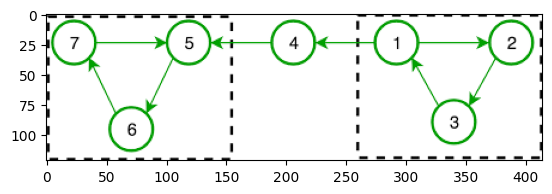

In [ ]:
plt.imshow(image)
plt.show()

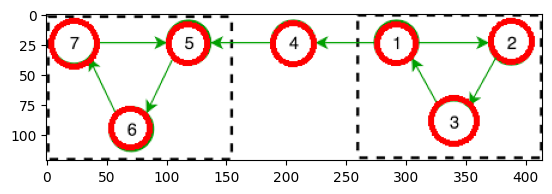

In [ ]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, dp=1.2, minDist=30,
                           param1=50, param2=30, minRadius=10, maxRadius=40)


if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0, :]:
        cv2.circle(image, (i[0], i[1]), i[2], (0, 0, 255), 4)


plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()


### COVID‐19 Chart

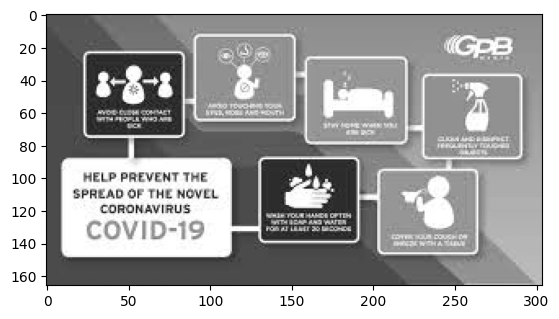

In [3]:
img = cv2.imread('/content/Multi_objects_separation.jpeg', cv2.IMREAD_GRAYSCALE)
plt.imshow(img)
plt.show()

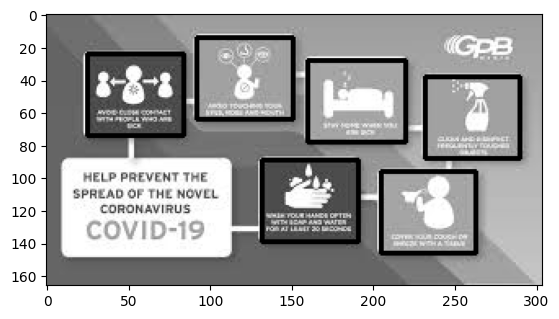

In [4]:
thresh = cv2.adaptiveThreshold(img, 255,
                               cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                               cv2.THRESH_BINARY_INV, 11, 2)

contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)



for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    area = cv2.contourArea(contour)
    aspect_ratio = w / float(h)

    if area > 1000 and 0.8 < aspect_ratio < 1.5:
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 0, 0), 2)


plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

## Enhancement of Blurry Images

In [ ]:
sharpen = np.array((
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]), dtype="int")


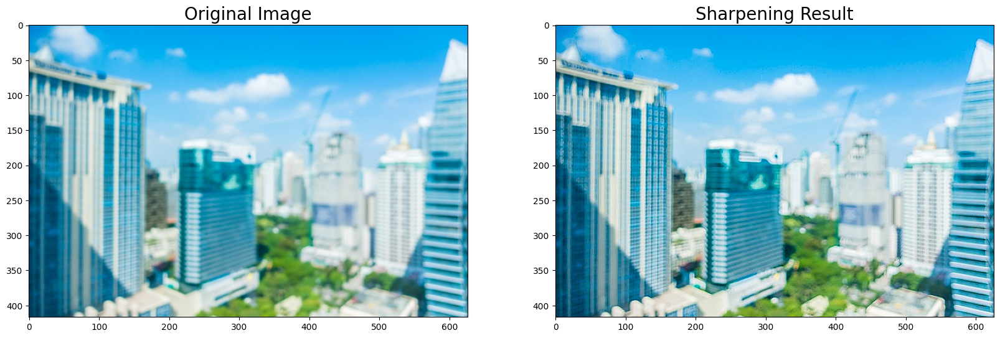

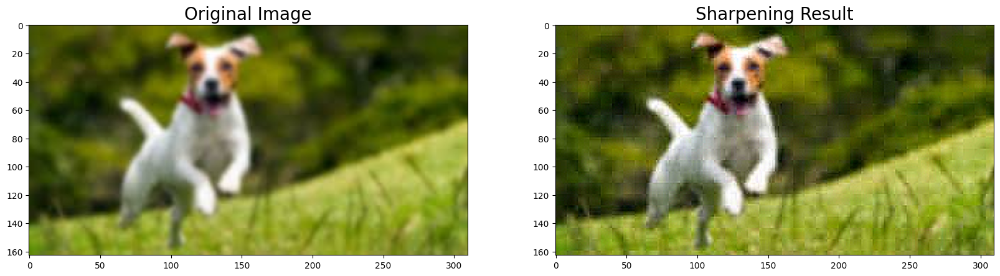

In [ ]:
images = ['/content/Building.jpg', '/content/Dog.jpeg']

for image in images:
  image =  cv2.imread(image)
  sharpenOutput = cv2.filter2D(image, -1, sharpen)

  plt.figure(figsize=[20,10])
  plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original Image")
  plt.subplot(122);plt.imshow(sharpenOutput[...,::-1]);plt.title("Sharpening Result")

## Noise removal from Noisy Images

### text image

In [ ]:
image = cv2.imread('/content/Text.jpeg')

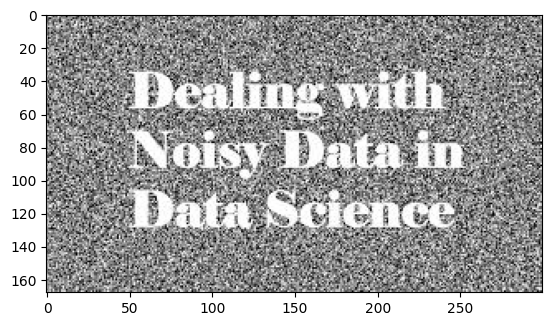

In [ ]:
plt.imshow(image)

#### median

Text(0.5, 1.0, 'Median Blur Result : KernelSize = 5')

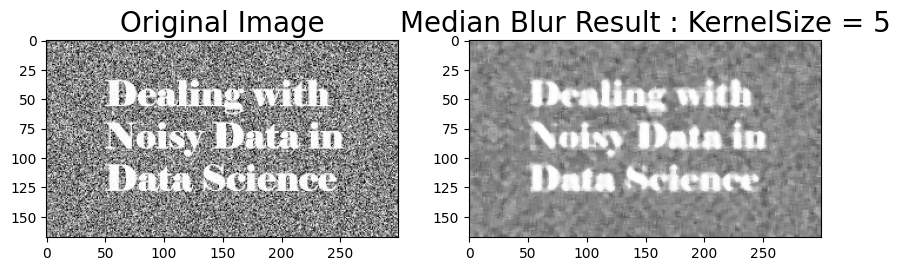

In [ ]:
kernelSize = 5
medianBlurred = cv2.medianBlur(image,kernelSize)

plt.figure(figsize=[10,10])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(122);plt.imshow(medianBlurred[...,::-1]);plt.title("Median Blur Result : KernelSize = 5")

Text(0.5, 1.0, 'Sharpening Result')

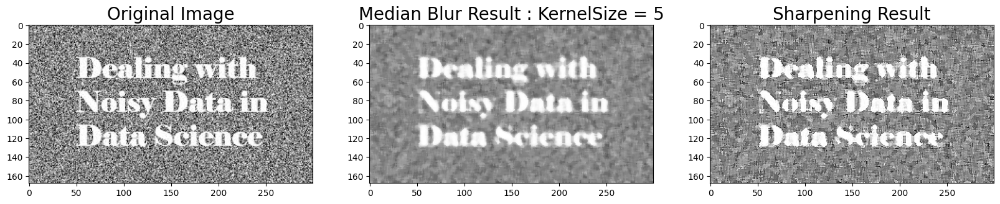

In [ ]:
sharpen = np.array((
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]), dtype="int")

sharpenOutput = cv2.filter2D(medianBlurred, -1, sharpen)

plt.figure(figsize=[20,10])
plt.subplot(131);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(132);plt.imshow(medianBlurred[...,::-1]);plt.title("Median Blur Result : KernelSize = 5")
plt.subplot(133);plt.imshow(sharpenOutput[...,::-1]);plt.title("Sharpening Result")

#### fastNlMeansDenoising

Text(0.5, 1.0, 'Noise removed')

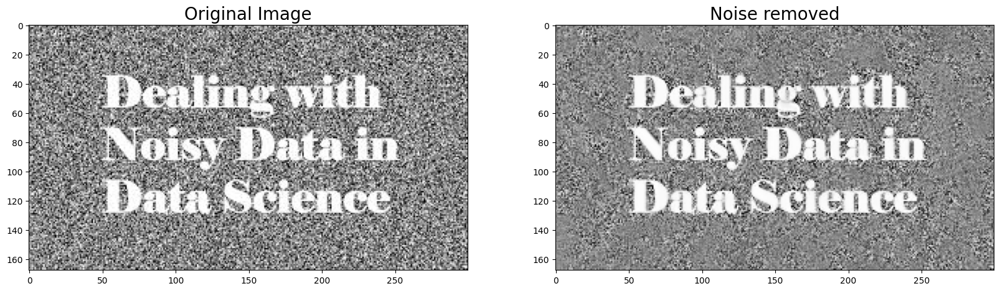

In [ ]:
denoised = cv2.fastNlMeansDenoising(image, None, h=30,
            templateWindowSize=7, searchWindowSize=21)


plt.figure(figsize=[20,10])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(122);plt.imshow(denoised[...,::-1]);plt.title("Noise removed")

In [ ]:
kernel = np.ones((5,5), np.uint8)

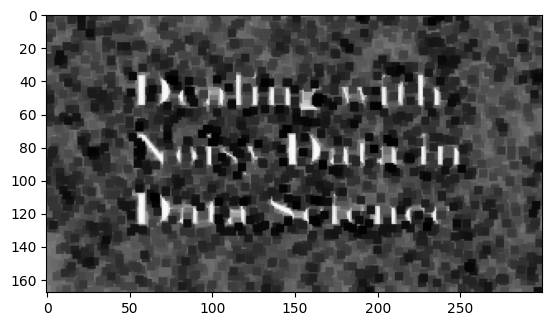

In [ ]:
erosion = cv2.erode(denoised, kernel, iterations=1)
plt.imshow(erosion)

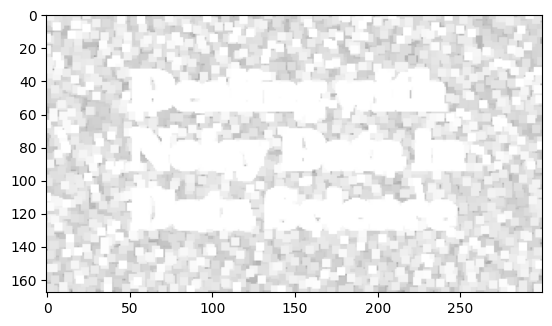

In [ ]:
dilation = cv2.dilate(image, kernel, iterations=1)
plt.imshow(dilation)

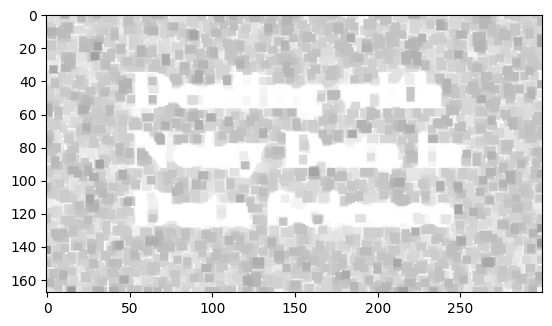

In [ ]:
closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
plt.imshow(closing)

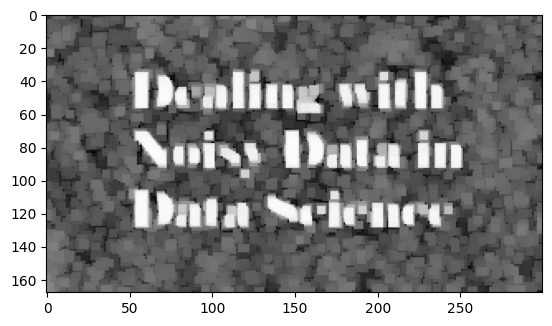

In [ ]:
opening = cv2.morphologyEx(denoised, cv2.MORPH_OPEN, kernel)
plt.imshow(opening)

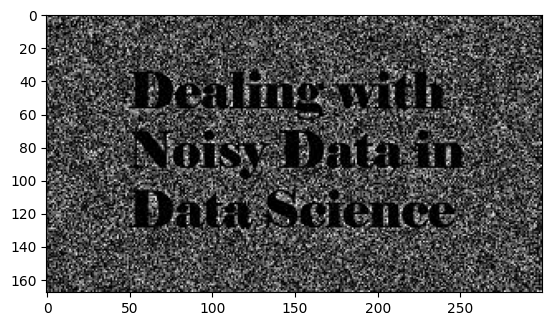

In [ ]:
subtracted = cv2.subtract(closing, image)
plt.imshow(subtracted)

Text(0.5, 1.0, 'Noise removed')

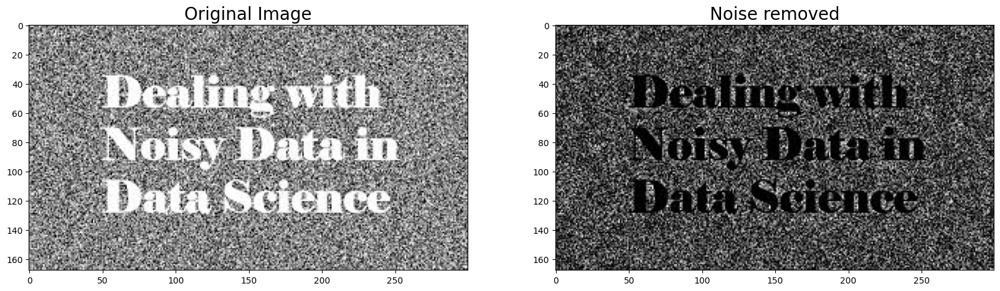

In [ ]:
denoised = cv2.fastNlMeansDenoising(subtracted, None, h=30, templateWindowSize=7, searchWindowSize=21)


plt.figure(figsize=[20,10])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(122);plt.imshow(subtracted[...,::-1]);plt.title("Noise removed")

#### Gaussian

In [ ]:
dst1=cv2.GaussianBlur(image,(5,5),0,0)
combined = np.hstack((image, dst1))

Text(0.5, 1.0, 'Gaussian Blur Result 1 : KernelSize = 5')

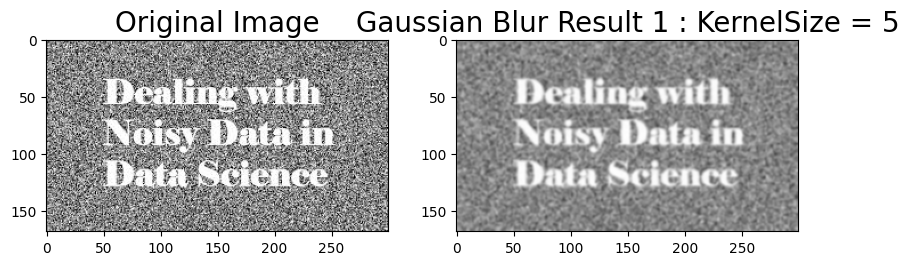

In [ ]:
plt.figure(figsize=[15,10])
plt.subplot(131);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(132);plt.imshow(dst1[...,::-1]);plt.title("Gaussian Blur Result 1 : KernelSize = 5")


Text(0.5, 1.0, 'Sharpening Result')

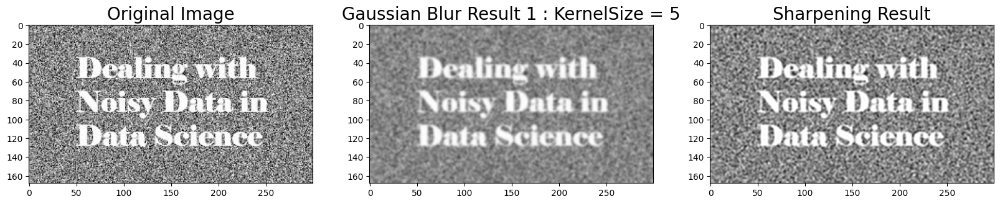

In [ ]:
sharpen = np.array((
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]), dtype="int")

sharpenOutput = cv2.filter2D(dst1, -1, sharpen)

plt.figure(figsize=[20,10])
plt.subplot(131);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(132);plt.imshow(dst1[...,::-1]);plt.title("Gaussian Blur Result 1 : KernelSize = 5")
plt.subplot(133);plt.imshow(sharpenOutput[...,::-1]);plt.title("Sharpening Result")

#### bilateral

In [ ]:
bilateral = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)

In [ ]:
denoised = cv2.fastNlMeansDenoising(bilateral, None, h=30, templateWindowSize=7, searchWindowSize=21)

Text(0.5, 1.0, 'denoised Result')

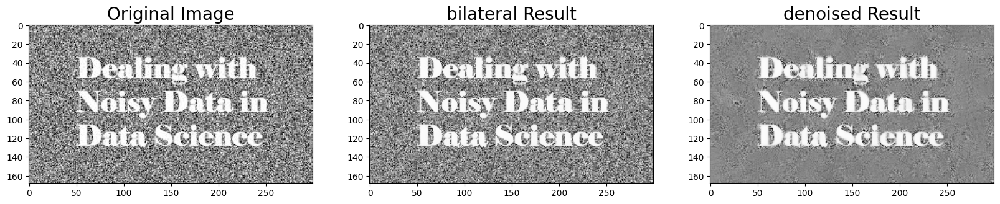

In [ ]:
plt.figure(figsize=[20,10])
plt.subplot(131);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(132);plt.imshow(bilateral[...,::-1]);plt.title("bilateral Result")
plt.subplot(133);plt.imshow(denoised[...,::-1]);plt.title("denoised Result")

### Rocket image

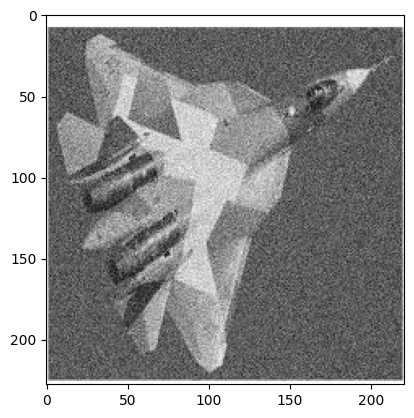

In [ ]:
image = cv2.imread('/content/Rocket.jpeg')
plt.imshow(image)

#### gaussian

In [ ]:
dst1=cv2.GaussianBlur(image,(5,5),0,0)
combined = np.hstack((image, dst1))

Text(0.5, 1.0, 'Gaussian Blur Result 1 : KernelSize = 5')

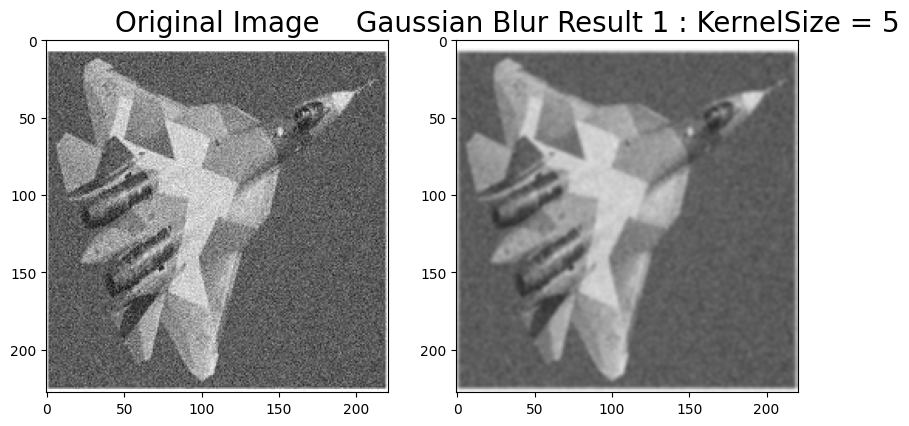

In [ ]:
plt.figure(figsize=[15,10])
plt.subplot(131);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(132);plt.imshow(dst1[...,::-1]);plt.title("Gaussian Blur Result 1 : KernelSize = 5")


#### fastNlMeansDenoising

Text(0.5, 1.0, 'Noise removed')

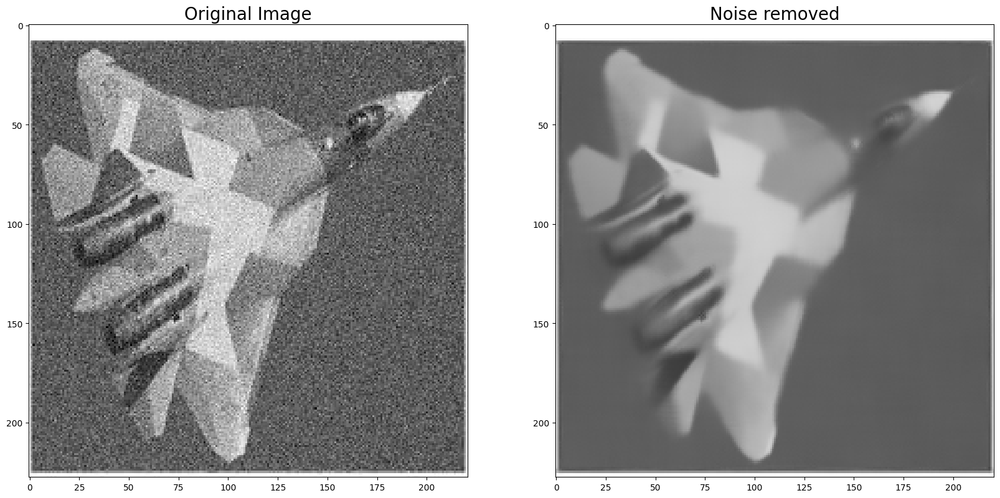

In [ ]:
denoised = cv2.fastNlMeansDenoising(image, None, h=30, templateWindowSize=7, searchWindowSize=21)


plt.figure(figsize=[20,10])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(122);plt.imshow(denoised[...,::-1]);plt.title("Noise removed")

#### median

Text(0.5, 1.0, 'Median Blur Result : KernelSize = 5')

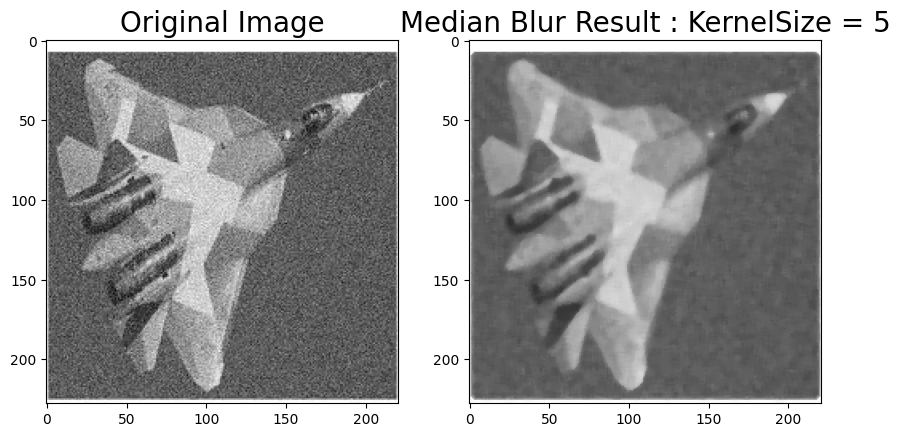

In [ ]:
kernelSize = 5
medianBlurred = cv2.medianBlur(image,kernelSize)

plt.figure(figsize=[10,10])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(122);plt.imshow(medianBlurred[...,::-1]);plt.title("Median Blur Result : KernelSize = 5")

#### sharpning

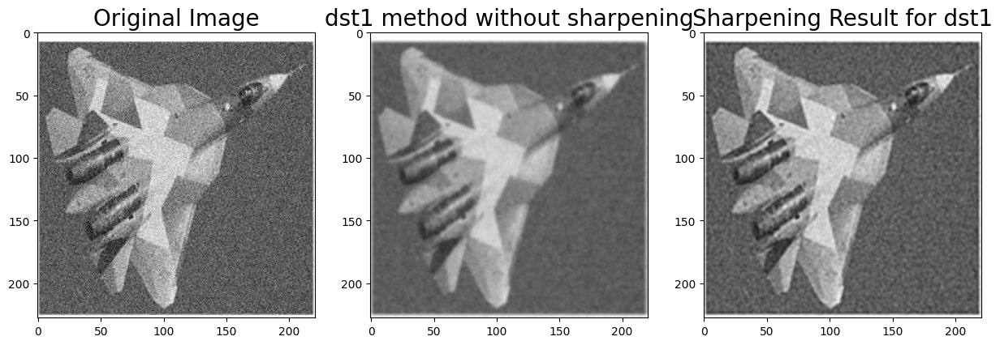

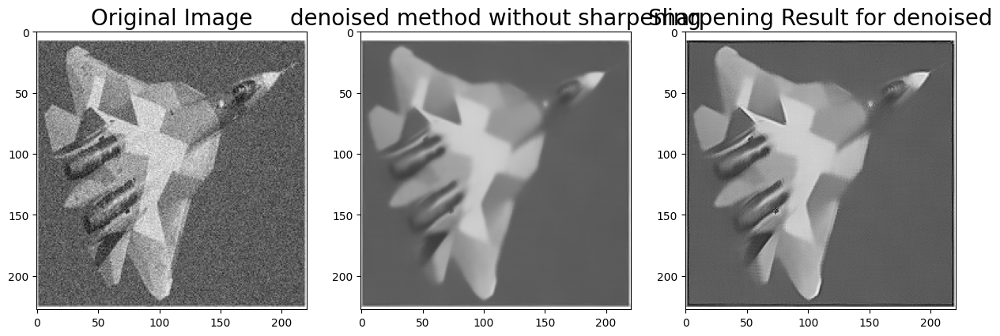

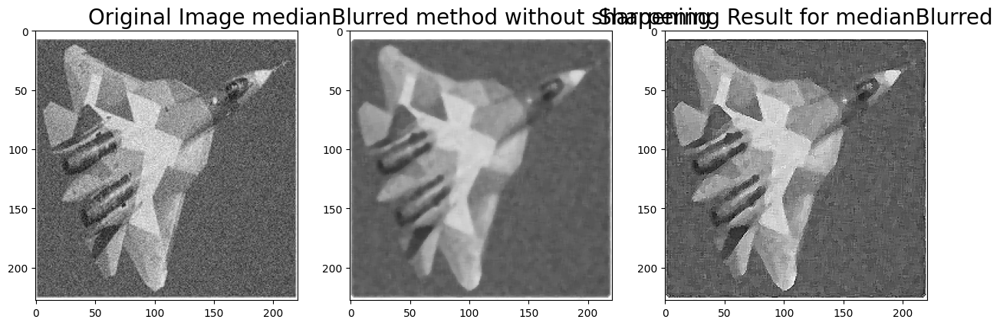

In [ ]:
sharpen = np.array((
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]), dtype="int")

images = [(dst1,"dst1"), (denoised,"denoised"),(medianBlurred,"medianBlurred")]

for img, title in images:
  sharpenOutput = cv2.filter2D(img, -1, sharpen)
  plt.figure(figsize=[15,10])
  plt.subplot(131);plt.imshow(image[...,::-1]);plt.title("Original Image")
  plt.subplot(132);plt.imshow(img[...,::-1]);plt.title(f"{title} method without sharpening")
  plt.subplot(133);plt.imshow(sharpenOutput[...,::-1]);plt.title(f"Sharpening Result for {title}")

#### final denised image

Text(0.5, 1.0, 'final denoised rocket image')

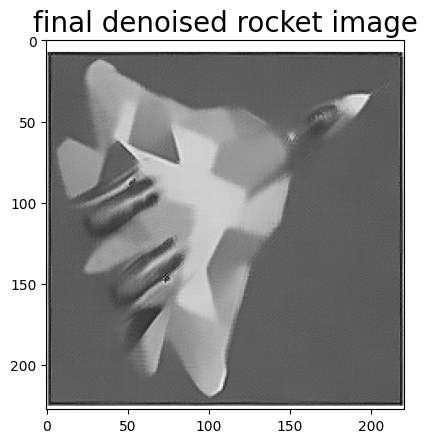

In [ ]:
  sharpenOutput = cv2.filter2D(denoised, -1, sharpen)
  plt.imshow(sharpenOutput)
  plt.title('final denoised rocket image')

### windchart

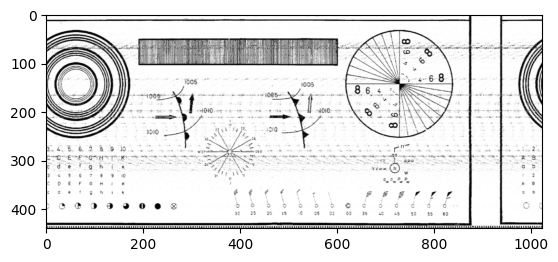

In [ ]:
image = cv2.imread('/content/Noisy_1.png')
plt.imshow(image)

#### adaptive thresholding

In [ ]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
img_thresh_adp = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 13, 7)

Text(0.5, 1.0, 'Thresholded (adaptive)')

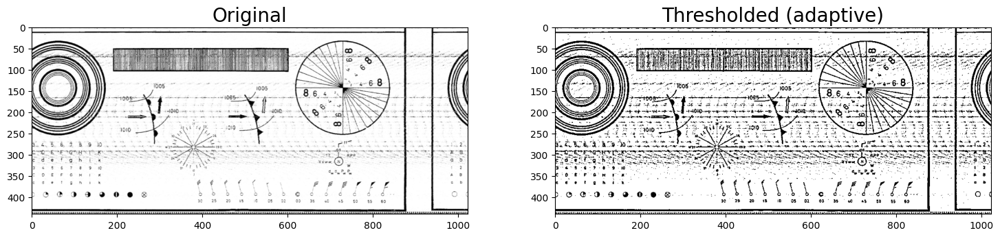

In [ ]:
plt.figure(figsize = [18, 15])
plt.subplot(121); plt.imshow(image);              plt.title('Original')
plt.subplot(122); plt.imshow(img_thresh_adp);   plt.title('Thresholded (adaptive)')

#### global thresholding

Text(0.5, 1.0, 'Thresholded (global: 110)')

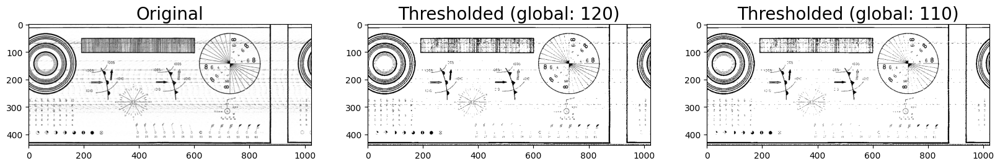

In [ ]:
img = cv2.imread('/content/Noisy_1.png', cv2.IMREAD_GRAYSCALE)
retval, img_thresh_gbl_1 = cv2.threshold(img, 120, 255, cv2.THRESH_BINARY)
retval, img_thresh_gbl_2 = cv2.threshold(img, 110, 255, cv2.THRESH_BINARY)

plt.figure(figsize = [20, 10])
plt.subplot(131); plt.imshow(img);              plt.title('Original')
plt.subplot(132); plt.imshow(img_thresh_gbl_1); plt.title('Thresholded (global: 120)')
plt.subplot(133); plt.imshow(img_thresh_gbl_2); plt.title('Thresholded (global: 110)')

#### final denoised windchart

Text(0.5, 1.0, 'final denoised windchart with global 120')

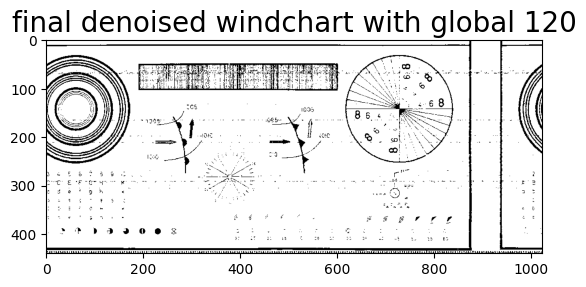

In [ ]:
plt.imshow(img_thresh_gbl_1); plt.title('final denoised windchart with global 120')

## Visual enhancement

### Newspaper

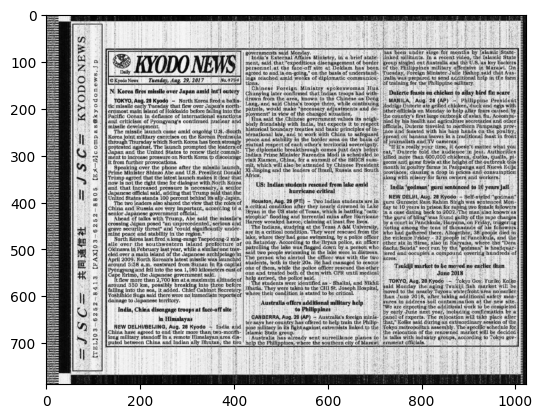

In [ ]:
image = cv2.imread('/content/Noisy_2.jpg', cv2.IMREAD_GRAYSCALE)
plt.imshow(image)

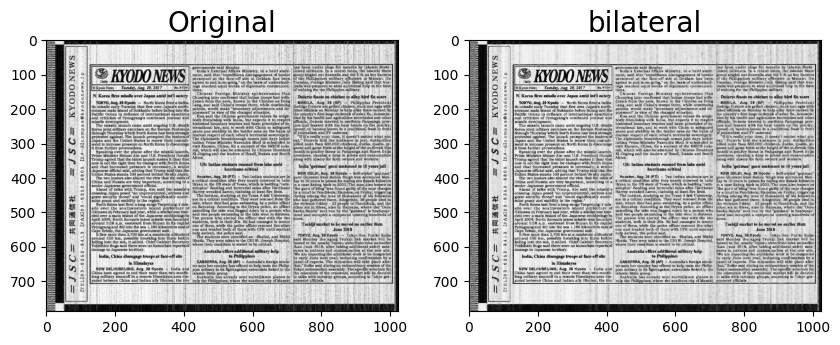

In [ ]:
bilateral = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)

kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])



sharpenOutput = cv2.filter2D(bilateral, -1, kernel)

plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(image, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('bilateral')
plt.imshow(sharpenOutput, cmap='gray')
plt.show()

### Name Plate

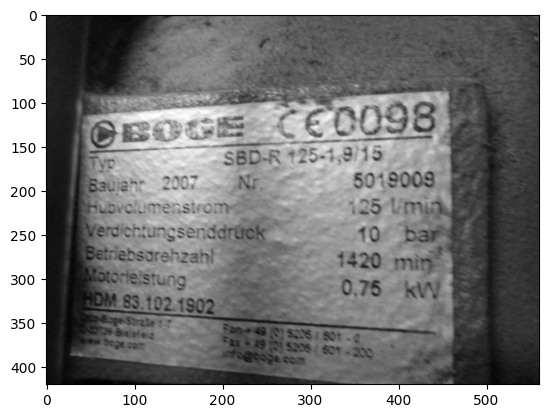

In [ ]:
image = cv2.imread('/content/Name plate.jpg', cv2.IMREAD_GRAYSCALE)
plt.imshow(image)

#### Equalization then sharpining

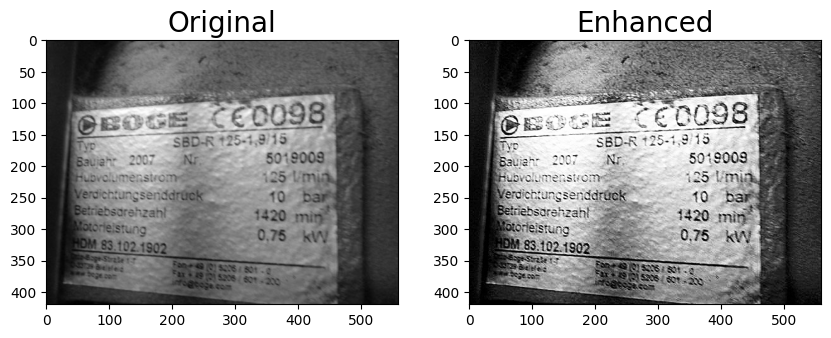

In [ ]:
imEq = cv2.equalizeHist(image)

kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
sharpenOutput = cv2.filter2D(imEq, -1, kernel)


plt.figure(figsize=(10,6))
plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(image, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Enhanced')
plt.imshow(sharpenOutput, cmap='gray')
plt.show()

#### Final enhanced image

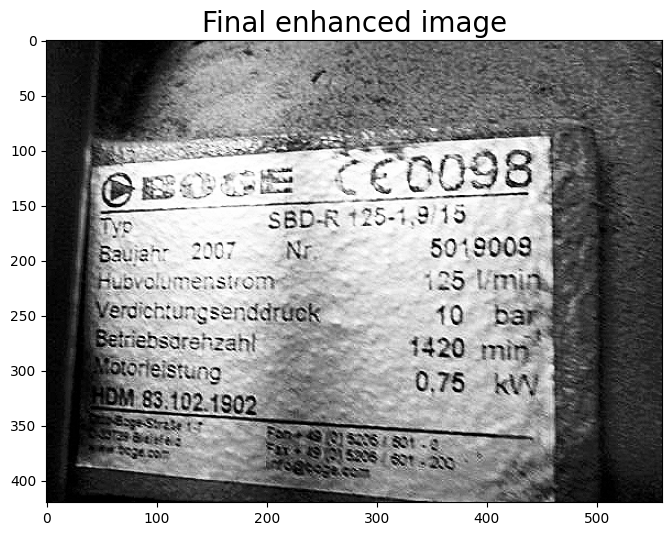

In [ ]:
plt.figure(figsize=(10,6))
plt.title('Final enhanced image')
plt.imshow(sharpenOutput, cmap='gray')